<center> <h1>SegArt</h1> </center>

A través de un algoritmo de clusterización (KMeans) se busca realizar una segmentación de la imagen en sus colores principales, con el objetivo de crear composiciones artísticas. 

In [1]:
from matplotlib.image import imread
import os
import matplotlib.pyplot as plt
from sklearn.cluster import MiniBatchKMeans
import time
import numpy as np
import copy

## Pre-procesamiento

En primer lugar es necesario leer la imagen y transformarla en una matrix con dimensiones (n_pixeles, n_canales). Como las imágenes son a color, los canales son tres: R (rojo), G (verde) y B (azul). 

In [2]:
def leer_imagen(imagen):
    imagen = imread(os.path.join("imagenes", imagen), 0)
    imagen = imagen[:,:,:3]
    X = imagen.reshape(-1, 3)
    return imagen, X

In [3]:
imagen, X = leer_imagen("pikachu.png")

Una vez preprocesada la imagen se entrena el algoritmo de clusterización. El centro de cada *cluster* será un punto en el espacio tridimensional (una dimensión por cada canal de color). Cada pixel es entonces cambiado al color del centroide de su respectivo *cluster*.

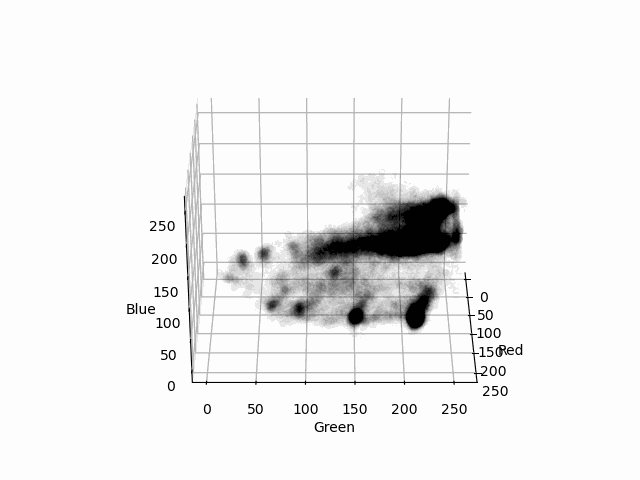

Pixeles de una imagen de Pikachu (ver "Imagen original" del Ejemplo 1 en la sección **Resultados**) graficados en el espacio tridimensional RGB.

Nótese que la mayoría de los pixeles están agrupados en la zona con valores bajos de rojo y altos de verde. Estos corresponden al fondo de pasto de la imagen. Aquel grupo concentrado de puntos con valores altos tanto de rojo como de verde corresponden a la parte amarilla de la figura del Pikachu (es necesario recordar que el amarillo se forma de la combinación entre estos dos colores).

## Clusterizaciónm

0.3541974 segundos


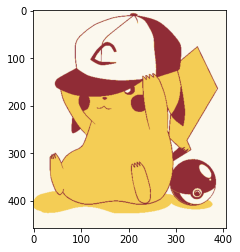

In [4]:
t0 = time.clock()


kmeans = MiniBatchKMeans(n_clusters=3, batch_size = 128).fit(X)
img_segmentada = kmeans.cluster_centers_[kmeans.labels_]
img_segmentada = img_segmentada.reshape(imagen.shape)

plt.imshow(img_segmentada.astype('uint8'))


print(time.clock() - t0, "segundos")

## Cambio de estilo

La segmentación de por si da un nuevo aspecto (más minimalista), que para algunas imágenes puede quedar muy bien. Sin embargo, me pareció que se podía aprovechar esta segmentación para tener la libertad de cambiar los colores de la imagen.

Para no cambiar los atributos del algoritmo y evitar tener que reentrenarlo cada vez que se quiera volver a la imagen original creé una copia de la instancia del algoritmo para cambiar sus atributos.

In [5]:
kmeans_dup = copy.deepcopy(kmeans) 

Las siguientes dos funciones cambian el color de un determinado segmento (cluster) dada una lista con los valores que se quiera dar a los canales RGB. 

In [6]:
def cambiar_intensidad(kmeans, cluster, int_color, color):
    colores = kmeans.cluster_centers_
    labels = kmeans.labels_
    
    if int_color == None:
        pass 
    elif type(int_color) in [int, float]:
        colores[cluster, color] = int_color
        
    else:
        raise ValueError("Esto no debería pasar")
        
    imagen_2d = colores[labels]
    return imagen_2d

In [7]:
def cambiar_intensidades(kmeans, cluster, lista_intens):
    for color, int_color in enumerate(lista_intens):
        imagen_2d = cambiar_intensidad(kmeans, cluster, int_color, color)
    
    return imagen_2d

Es muy útil poder visualizar los colores que representa cada cluster para saber cuál se quiere cambiar. Las siguientes celdas permiten esto mismo.

In [8]:
def ver_color_clusters(kmeans, cluster):
    colores = kmeans.cluster_centers_
    color = colores[cluster]
    cuadrado = np.zeros((100, 100, len(color)))
    for i, canal in enumerate(color):
        cuadrado[:, :, i] = canal
    return cuadrado, color    
        

In [9]:
cuadrado, color = ver_color_clusters(kmeans_dup, 2)

R: 144, G: 44, B: 54


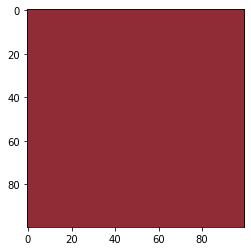

In [10]:
print("R: {}, G: {}, B: {}".format(int(color[0]), int(color[1]), int(color[2])))
plt.imshow(cuadrado.astype('uint8'));

Ahora sí, es hora de ver un ejemplo de como podría quedar la composición cambiando el segundo cluster (que corresponde al color rojo oscuro visualizado).

In [11]:
img_nueva = cambiar_intensidades(kmeans_dup, 2, [30, 10, 50])

In [12]:
#Se vuelve a pasar de una matriz (n_pixeles, n_canales) a la forma de la imagen original (ancho, alto, n_canales)
img_nueva = img_nueva.reshape(imagen.shape)

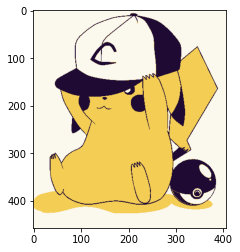

In [13]:
plt.imshow(img_nueva.astype('uint8'))

Cabe destacar que el algoritmo utilizado sirve para hacer clusterización y no obtiene resultados como los de una red neuronal convolucional en segmentación de imagen, por lo que no sería prudente esperar (ni el objetivo de este trabajo) que haga un gran trabajo separando los objetos de la imagen, sino que lo que hará es agrupar los pixeles según la similitud en su color. Aún así los resultados son muy interesantes y con imágenes simples se pueden obtener composiciones que recuerdan al *arte Pop*, logos y figuras minimalistas muy estéticas de forma muy fácil.

## Resultados

**Ejemplo 1:**

Imagen original

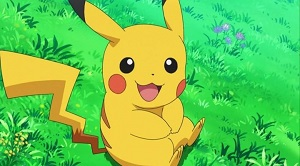

Imagen segmentada en 2 colores (K = 2) sin y con cambio de estilo.

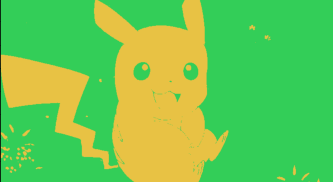

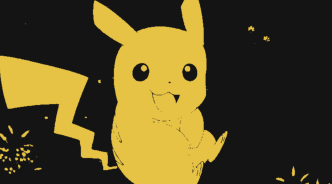

Imagen segmentada en 3 colores (K = 3) sin y con cambio de estilo.

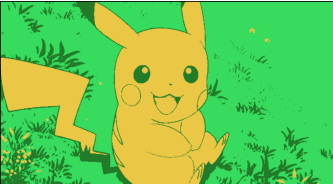

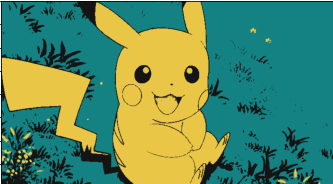

**Ejemplo 2:** (Arte Pop)

Imagen Original

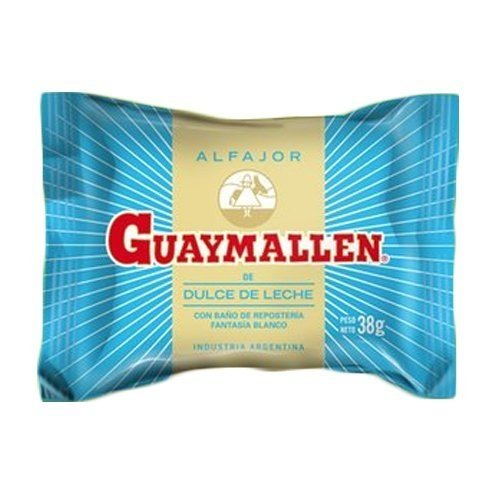

Arte pop con 4 composiciones. Fueron generadas cambiando el estilo de la imagen original segmentada en 4 colores (K = 4)

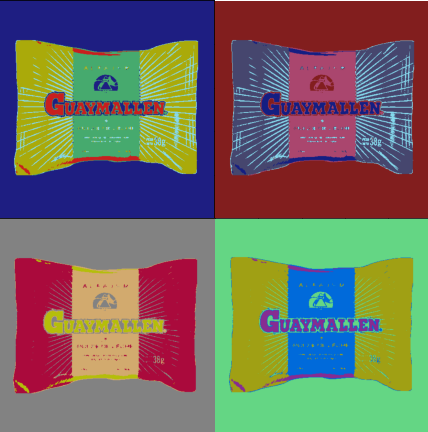